In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os

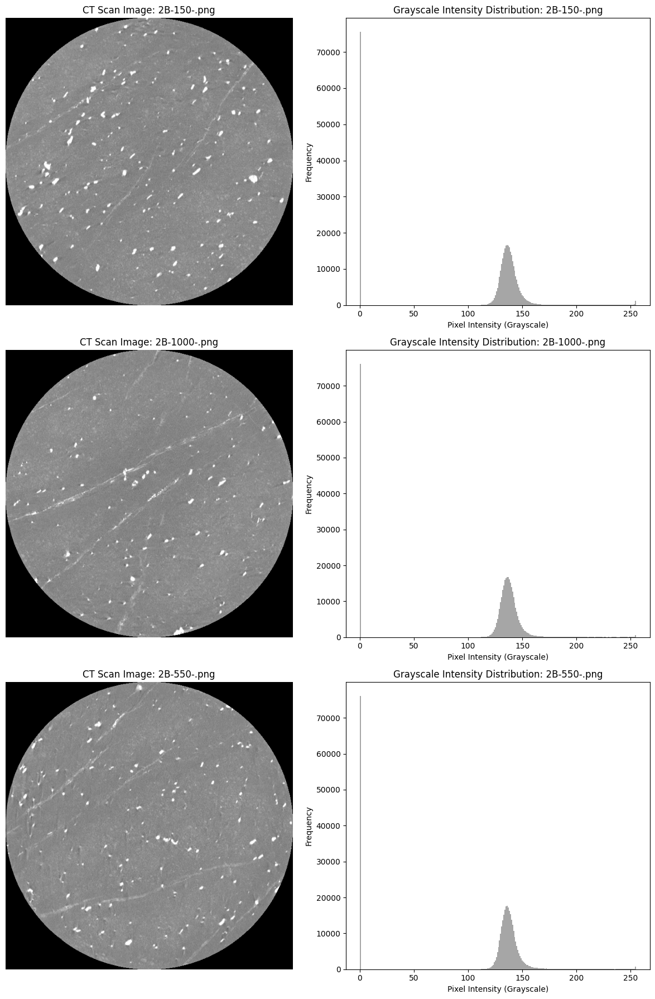

In [2]:
# Folder path
folder_path = "/Users/anna/Desktop/morect/2B-220(redone)/"

# Filenames
image_files = ["2B-150-.png", "2B-1000-.png", "2B-550-.png"]

# Create a figure for the images and histograms
plt.figure(figsize=(12, 6 * len(image_files)))


for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Display CT image
    plt.subplot(len(image_files), 2, 2 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"CT Scan Image: {image_file}")
    plt.axis("off")
    
    # Plot grayscale intensities
    plt.subplot(len(image_files), 2, 2 * i + 2)
    plt.hist(ct_array.flatten(), bins=256, color="gray", alpha=0.7)
    plt.title(f"Grayscale Intensity Distribution: {image_file}")
    plt.xlabel("Pixel Intensity (Grayscale)")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

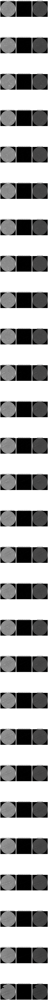

In [25]:
#Sample 2 has a relatively high amount of fracture-filling carbonate mineralization occurring in the sample

# Folder path
folder_path = "/Users/anna/Desktop/morect/2B-220(redone)/"

# Filenames
image_files = ["2B-150-.png","2B-200-.png","2B-250-.png","2B-300-.png","2B-350-.png","2B-400-.png",
               "2B-450-.png","2B-500-.png","2B-550-.png","2B-600-.png","2B-650-.png","2B-700-.png","2B-750-.png",
               "2B-800-.png","2B-850-.png","2B-900-.png","2B-950-.png","2B-1000-.png","2B-1050-.png","2B-1100-.png"
               ,"2B-1150-.png","2B-1200-.png","2B-1250-.png","2B-1300-.png", "2B-1350-.png","2B-1400-.png","2B-1450-.png","2B-1500-.png"]


#Carbonate
lower_threshold = 163
upper_threshold = 164

# Create a figure for the images and overlays
plt.figure(figsize=(12, 9 * len(image_files)))

# Loop through each image file
for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Create a color overlay with transparency
    overlay = np.zeros((*ct_array.shape, 3), dtype=np.uint8)  # Create an RGB image
    overlay[..., 0] = 255  # Red channel for the overlay
    overlay[~segmented_mask] = 0  # Set non-segmented areas to black
    
    # Combine original image and overlay using alpha blending
    alpha = 0.5  # Transparency level (0 = fully transparent, 1 = fully opaque)
    overlayed_image = np.dstack([ct_array] * 3)  # Convert grayscale to RGB
    overlayed_image = overlayed_image * (1 - alpha) + overlay * alpha
    
    # Plot the original, segmented, and overlayed images
    plt.subplot(len(image_files), 3, 3 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"Original CT Scan Image: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 2)
    plt.imshow(segmented_mask, cmap="gray")
    plt.title(f"Segmented Mask ({lower_threshold}-{upper_threshold} Intensity)")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 3)
    plt.imshow(overlayed_image.astype(np.uint8))
    plt.title(f"Overlayed Image")
    plt.axis("off")

plt.tight_layout()
#plt.savefig('1A-85-350-segmented(40-41).png')
plt.show()

In [26]:
# Folder path
folder_path = "/Users/anna/Desktop/morect/2B-220(redone)/"

# Filenames
image_files = ["2B-150-.png","2B-200-.png","2B-250-.png","2B-300-.png","2B-350-.png","2B-400-.png",
               "2B-450-.png","2B-500-.png","2B-550-.png","2B-600-.png","2B-650-.png","2B-700-.png","2B-750-.png",
               "2B-800-.png","2B-850-.png","2B-900-.png","2B-950-.png","2B-1000-.png","2B-1050-.png","2B-1100-.png"
               ,"2B-1150-.png","2B-1200-.png","2B-1250-.png","2B-1300-.png", "2B-1350-.png","2B-1400-.png","2B-1450-.png","2B-1500-.png"]

# Intensity threshold
lower_threshold = 163
upper_threshold = 164

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Calculate percentage
    total_pixels = ct_array.size
    segmented_pixels = np.sum(segmented_mask)
    percentage = (segmented_pixels / total_pixels) * 100
    
    print(f"Image: {image_file} - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"Total Core - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {total_core_percentage:.2f}%")

Image: 2B-150-.png - Percentage of pixels in range 163-164: 0.18%
Image: 2B-200-.png - Percentage of pixels in range 163-164: 0.18%
Image: 2B-250-.png - Percentage of pixels in range 163-164: 0.17%
Image: 2B-300-.png - Percentage of pixels in range 163-164: 0.18%
Image: 2B-350-.png - Percentage of pixels in range 163-164: 0.20%
Image: 2B-400-.png - Percentage of pixels in range 163-164: 0.18%
Image: 2B-450-.png - Percentage of pixels in range 163-164: 0.18%
Image: 2B-500-.png - Percentage of pixels in range 163-164: 0.20%
Image: 2B-550-.png - Percentage of pixels in range 163-164: 0.20%
Image: 2B-600-.png - Percentage of pixels in range 163-164: 0.19%
Image: 2B-650-.png - Percentage of pixels in range 163-164: 0.20%
Image: 2B-700-.png - Percentage of pixels in range 163-164: 0.17%
Image: 2B-750-.png - Percentage of pixels in range 163-164: 0.19%
Image: 2B-800-.png - Percentage of pixels in range 163-164: 0.22%
Image: 2B-850-.png - Percentage of pixels in range 163-164: 0.20%
Image: 2B-